# FINA5511Z INVESTMENT PROJECT

**a)  (2%) Download the Adjusted Closing Prices (adjusted for dividends and stock splits) for each stock from Dec 1, 2018 to Dec 1, 2023 through Yahoo! Finance.** 

In [232]:
#Install the library
!pip install yfinance

# Import the library
import yfinance as yf 
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
# datetime offers classes that work with date & time information
import datetime as dt

In [233]:
# Define the stock ticker

ticker_symbol = ['AAPL','UNH', 'V', 'KO', 'CVX', 'MCD']   # Example: Apple Inc.

# Download data
stock_price = yf.download(ticker_symbol, start='2018-12-01', end='2023-12-01')

# Get the adjusted close prices
adj_close_prices = stock_price['Adj Close']

# Display the adjusted close prices
print(adj_close_prices.head())

[*********************100%***********************]  6 of 6 completed

Ticker                          AAPL        CVX         KO         MCD  \
Date                                                                     
2018-12-03 00:00:00+00:00  44.131866  93.791641  41.561531  162.185715   
2018-12-04 00:00:00+00:00  42.190559  91.125656  41.469524  161.896957   
2018-12-06 00:00:00+00:00  41.720154  90.091904  41.302242  162.255676   
2018-12-07 00:00:00+00:00  40.232544  89.765472  41.059689  160.077118   
2018-12-10 00:00:00+00:00  40.497585  89.337975  41.185150  161.555756   

Ticker                            UNH           V  
Date                                               
2018-12-03 00:00:00+00:00  262.621338  139.075455  
2018-12-04 00:00:00+00:00  255.485596  132.975357  
2018-12-06 00:00:00+00:00  253.926300  135.286865  
2018-12-07 00:00:00+00:00  246.891403  131.507874  
2018-12-10 00:00:00+00:00  244.460861  132.246414  


In [234]:
# Save the adjusted close prices to a CSV file
stock_price['Adj Close'].to_csv('adjusted_close_prices.csv')

# Print success message
print("Adjusted close prices saved as 'adjusted_close_prices.csv'")

Adjusted close prices saved as 'adjusted_close_prices.csv'


**b)  (4%) Visualize each stock price trend in a graph. Explain the possible reasons why these stocks perform similarly or differently.**

[*********************100%***********************]  6 of 6 completed


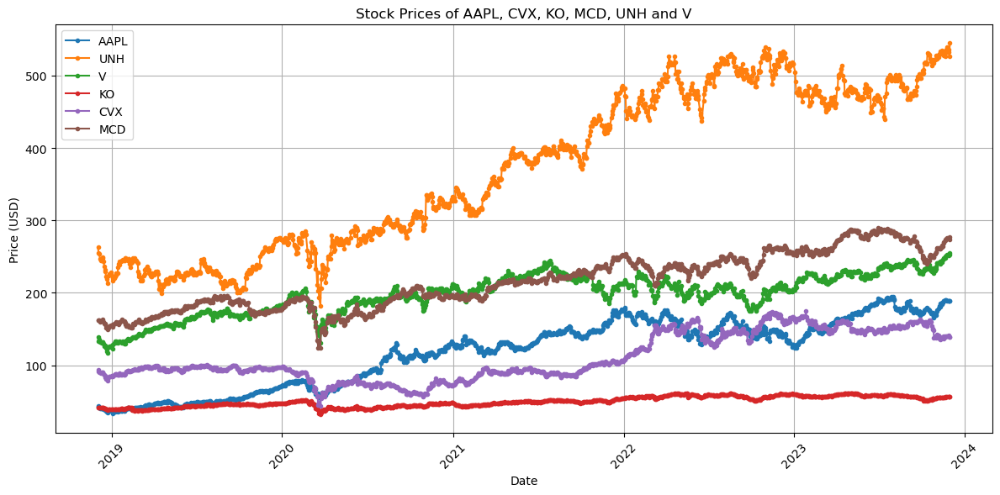

In [236]:

# Specify the starting and ending dates
startDate = dt.datetime(2018, 12, 1)
endDate = dt.datetime(2023, 12, 1)

# Create an empty DataFrame to hold the price data
stock_price_1 = yf.download(ticker_symbol, start=startDate, end=endDate)['Adj Close']

# Plot the stock prices
plt.figure(figsize=(12, 6))
for ticker in ticker_symbol:
    plt.plot(stock_price.index, stock_price_1[ticker], marker='.', label=ticker)

plt.title('Stock Prices of AAPL, CVX, KO, MCD, UNH and V')
plt.xlabel('Date')
plt.ylabel('Price (USD)')
plt.legend()
plt.grid()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [237]:
close_price= pd.read_csv('adjusted_close_prices.csv')
close_price

,Date,AAPL,CVX,KO,MCD,UNH,V
0,2018-12-03 00:00:00+00:00,44.131866,93.791641,41.561531,162.185715,262.621338,139.075455
1,2018-12-04 00:00:00+00:00,42.190559,91.125656,41.469524,161.896957,255.485596,132.975357
2,2018-12-06 00:00:00+00:00,41.720154,90.091904,41.302242,162.255676,253.926300,135.286865
3,2018-12-07 00:00:00+00:00,40.232544,89.765472,41.059689,160.077118,246.891403,131.507874
4,2018-12-10 00:00:00+00:00,40.497585,89.337975,41.185150,161.555756,244.460861,132.246414
...,...,...,...,...,...,...,...
1252,2023-11-24 00:00:00+00:00,189.043869,140.332413,56.812878,275.861511,538.893860,252.370987
1253,2023-11-27 00:00:00+00:00,188.864731,139.809448,56.706177,275.178070,535.436523,252.212158
1254,2023-11-28 00:00:00+00:00,189.471771,140.923203,56.822586,275.422150,532.422485,251.021271
1255,2023-11-29 00:00:00+00:00,188.446777,139.373657,56.483082,273.752625,526.955688,252.301483


**c)  (2%) Report the simple daily return (i.e., mean return) for each stock and present these visually using a histogram.**

In [251]:
# The objective of this code cell is to calculate the percentage daily return
# We will perform this calculation on all stocks except for the first column which is "Date"
daily_returns_df = close_price.iloc[:,1:].pct_change() * 100
daily_returns_df.replace(np.nan, 0, inplace = True)
daily_returns_df

,AAPL,CVX,KO,MCD,UNH,V
0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,-4.398878,-2.842455,-0.221375,-0.178041,-2.717122,-4.386178
2,-1.114955,-1.134425,-0.403386,0.221572,-0.610326,1.738298
3,-3.565686,-0.362331,-0.587265,-1.342670,-2.770448,-2.793318
4,0.658774,-0.476239,0.305559,0.923703,-0.984458,0.561594
...,...,...,...,...,...,...
1252,-0.700433,0.394917,0.256762,0.216355,0.614233,0.228613
1253,-0.094760,-0.372661,-0.187811,-0.247748,-0.641562,-0.062935
1254,0.321415,0.796623,0.205285,0.088699,-0.562912,-0.472177
1255,-0.540974,-1.099567,-0.597481,-0.606170,-1.026778,0.510002


In [253]:
# Insert the date column at the start of the Pandas DataFrame (@ index = 0)
daily_returns_df.insert(0, "Date", close_price['Date'])
daily_returns_df

,Date,AAPL,CVX,KO,MCD,UNH,V
0,2018-12-03 00:00:00+00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2018-12-04 00:00:00+00:00,-4.398878,-2.842455,-0.221375,-0.178041,-2.717122,-4.386178
2,2018-12-06 00:00:00+00:00,-1.114955,-1.134425,-0.403386,0.221572,-0.610326,1.738298
3,2018-12-07 00:00:00+00:00,-3.565686,-0.362331,-0.587265,-1.342670,-2.770448,-2.793318
4,2018-12-10 00:00:00+00:00,0.658774,-0.476239,0.305559,0.923703,-0.984458,0.561594
...,...,...,...,...,...,...,...
1252,2023-11-24 00:00:00+00:00,-0.700433,0.394917,0.256762,0.216355,0.614233,0.228613
1253,2023-11-27 00:00:00+00:00,-0.094760,-0.372661,-0.187811,-0.247748,-0.641562,-0.062935
1254,2023-11-28 00:00:00+00:00,0.321415,0.796623,0.205285,0.088699,-0.562912,-0.472177
1255,2023-11-29 00:00:00+00:00,-0.540974,-1.099567,-0.597481,-0.606170,-1.026778,0.510002


In [255]:
# Define a function that performs interactive data visualization using Plotly Express
def plot_stock_data(dt, title):
    
    fig = px.line(title = title)
    
    # For loop that plots all stock prices in the pandas dataframe df
    # Note that index starts with 1 because we want to skip the date column
    
    for i in dt.columns[1:]:
        fig.add_scatter(x = dt['Date'], y = dt[i], name = i)
        fig.update_traces(line_width = 5)
        fig.update_layout({'plot_bgcolor': "white"})

    fig.show()

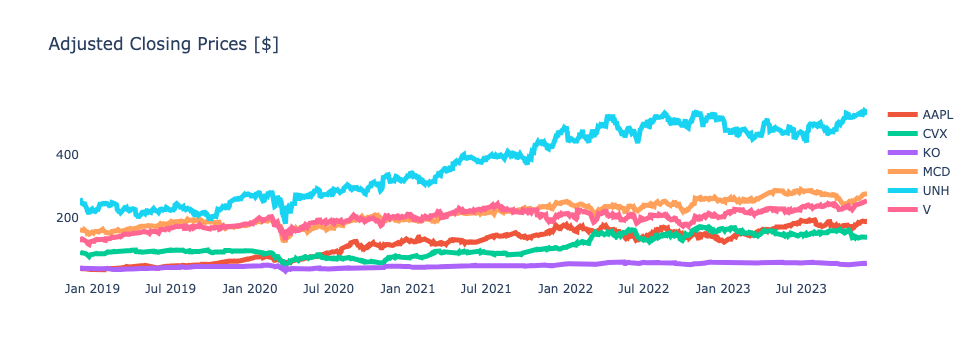

In [257]:
# Plot closing prices using plotly Express. Note that we used the same pre-defined function "plot_financial_data"
plot_stock_data(close_price, 'Adjusted Closing Prices [$]')

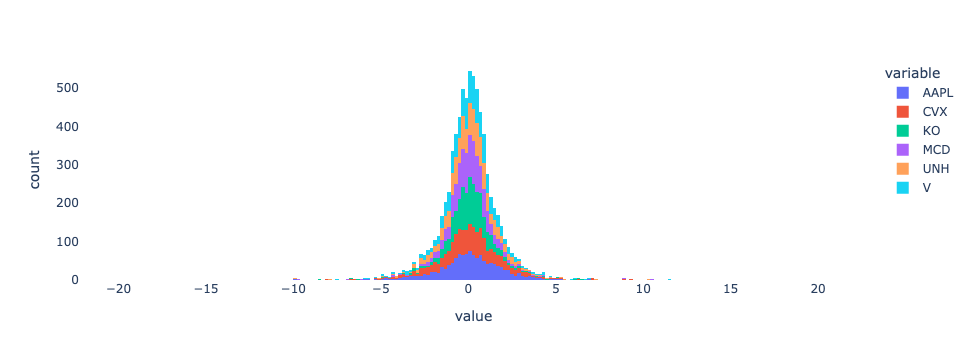

In [259]:
# Plot histograms for stocks daily returns using plotly express
# Compare daily returns histograms
fig = px.histogram(daily_returns_df.drop(columns = ['Date']))
fig.update_layout({'plot_bgcolor': "white"})

**d)  (2%) Estimate the historical volatility (i.e., standard deviation) of these returns for each stock.**

In [413]:
historical_volatility = daily_returns_df['AAPL'].std()* (252**0.5)  # Annualize the volatility  
# Display the results
print("Historical Volatility (Annualized):")
print(historical_volatility)


Historical Volatility (Annualized):
32.62428106684695


**e)  (10%) Plot the 6 securities in the return - standard deviation space. According to the mean-variance dominance criteria for risk-averse investors, does one security dominate all other securities? Is there any security dominated by all other securities? If there is such a security dominated by all other securities, will you keep it in your portfolio? Why or why not? Discuss with examples.**

**f)  (5%) Plot the correlation among your selected assets using a Heat Map.
Discuss the reasons why some assets are highly correlated while others are not.**


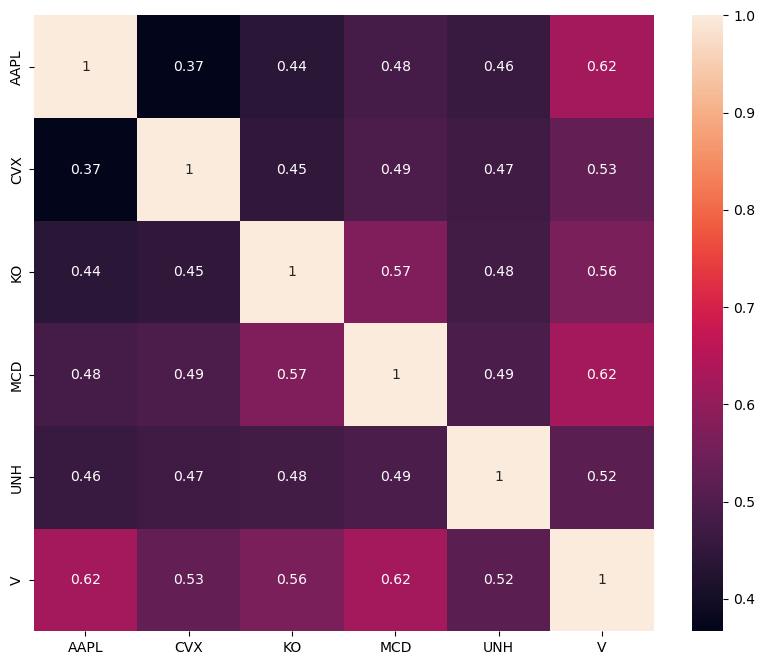

In [261]:
# Plot a heatmap showing the correlations between daily returns

plt.figure(figsize = (10, 8))
sns.heatmap(daily_returns_df.drop(columns = ['Date']).corr(), annot = True);

**g)  (10%) Report the composition of the tangency portfolio (with risky assets only) and weight of each stock. Report the expected return, volatility (standard deviation), and the Sharpe ratio of the tangency portfolio. When comparing the Sharpe ratio of the tangency portfolio with that of individual stocks, what conclusion can you draw?045f51b124d8.png)**

In [270]:
# Function to scale stock prices based on their initial starting price
# The objective of this function is to set all prices to start at a value of 1 
def price_scaling(raw_prices_df):
    scaled_prices_df = raw_prices_df.copy()
    for i in raw_prices_df.columns[1:]:
          scaled_prices_df[i] = raw_prices_df[i]/raw_prices_df[i][0]
    return scaled_prices_df

In [272]:
price_scaling(close_price)

,Date,AAPL,CVX,KO,MCD,UNH,V
0,2018-12-03 00:00:00+00:00,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-12-04 00:00:00+00:00,0.956011,0.971575,0.997786,0.998220,0.972829,0.956138
2,2018-12-06 00:00:00+00:00,0.945352,0.960554,0.993761,1.000431,0.966891,0.972759
3,2018-12-07 00:00:00+00:00,0.911644,0.957073,0.987925,0.986999,0.940104,0.945587
4,2018-12-10 00:00:00+00:00,0.917650,0.952515,0.990944,0.996116,0.930849,0.950897
...,...,...,...,...,...,...,...
1252,2023-11-24 00:00:00+00:00,4.283614,1.496214,1.366958,1.700899,2.051980,1.814634
1253,2023-11-27 00:00:00+00:00,4.279555,1.490639,1.364391,1.696685,2.038816,1.813492
1254,2023-11-28 00:00:00+00:00,4.293310,1.502513,1.367192,1.698190,2.027339,1.804929
1255,2023-11-29 00:00:00+00:00,4.270084,1.485992,1.359023,1.687896,2.006523,1.814134


In [274]:
# Let's create an array that holds random portfolio weights
# Note that portfolio weights must add up to 1 
import random

def generate_portfolio_weights(n):
    weights = []
    for i in range(n):
        weights.append(random.random())
        
    # let's make the sum of all weights add up to 1
    weights = weights/np.sum(weights)
    return weights

In [375]:
# Call the function (Run this cell multiple times to generate different outputs)
weights = generate_portfolio_weights(6)
print(weights)

[0.073987   0.19255618 0.51688112 0.08966388 0.11215814 0.01475368]


In [377]:
# Define the "weights" list similar to the slides
#weights = [0.032266, 0.094461, 0.117917, 0.132624, 0.145942, 0.128299, 0.10009, 0.007403, 0.088581, 0.152417]
weights = [0.073987, 0.19255618, 0.51688112, 0.08966388, 0.11215814, 0.01475368]
weights

[0.073987, 0.19255618, 0.51688112, 0.08966388, 0.11215814, 0.01475368]

In [379]:
# Display "close_price" Pandas DataFrame
close_price

,Date,AAPL,CVX,KO,MCD,UNH,V
0,2018-12-03 00:00:00+00:00,44.131866,93.791641,41.561531,162.185715,262.621338,139.075455
1,2018-12-04 00:00:00+00:00,42.190559,91.125656,41.469524,161.896957,255.485596,132.975357
2,2018-12-06 00:00:00+00:00,41.720154,90.091904,41.302242,162.255676,253.926300,135.286865
3,2018-12-07 00:00:00+00:00,40.232544,89.765472,41.059689,160.077118,246.891403,131.507874
4,2018-12-10 00:00:00+00:00,40.497585,89.337975,41.185150,161.555756,244.460861,132.246414
...,...,...,...,...,...,...,...
1252,2023-11-24 00:00:00+00:00,189.043869,140.332413,56.812878,275.861511,538.893860,252.370987
1253,2023-11-27 00:00:00+00:00,188.864731,139.809448,56.706177,275.178070,535.436523,252.212158
1254,2023-11-28 00:00:00+00:00,189.471771,140.923203,56.822586,275.422150,532.422485,251.021271
1255,2023-11-29 00:00:00+00:00,188.446777,139.373657,56.483082,273.752625,526.955688,252.301483


In [381]:
# Scale stock prices using the "price_scaling" function that we defined earlier (make all stock values start at 1)
portfolio_df = close_price.copy()
scaled_df = price_scaling(portfolio_df)
scaled_df

,Date,AAPL,CVX,KO,MCD,UNH,V
0,2018-12-03 00:00:00+00:00,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,2018-12-04 00:00:00+00:00,0.956011,0.971575,0.997786,0.998220,0.972829,0.956138
2,2018-12-06 00:00:00+00:00,0.945352,0.960554,0.993761,1.000431,0.966891,0.972759
3,2018-12-07 00:00:00+00:00,0.911644,0.957073,0.987925,0.986999,0.940104,0.945587
4,2018-12-10 00:00:00+00:00,0.917650,0.952515,0.990944,0.996116,0.930849,0.950897
...,...,...,...,...,...,...,...
1252,2023-11-24 00:00:00+00:00,4.283614,1.496214,1.366958,1.700899,2.051980,1.814634
1253,2023-11-27 00:00:00+00:00,4.279555,1.490639,1.364391,1.696685,2.038816,1.813492
1254,2023-11-28 00:00:00+00:00,4.293310,1.502513,1.367192,1.698190,2.027339,1.804929
1255,2023-11-29 00:00:00+00:00,4.270084,1.485992,1.359023,1.687896,2.006523,1.814134


In [383]:
# Use enumerate() method to obtain the stock names along with a counter "i" (0, 1, 2, 3,..etc.)
# This counter "i" will be used as an index to access elements in the "weights" list
initial_investment = 1000000
for i, stock in enumerate(scaled_df.columns[1:]):
    portfolio_df[stock] = weights[i] * scaled_df[stock]  * initial_investment
portfolio_df.round(1)

,Date,AAPL,CVX,KO,MCD,UNH,V
0,2018-12-03 00:00:00+00:00,73987.0,192556.2,516881.1,89663.9,112158.1,14753.7
1,2018-12-04 00:00:00+00:00,70732.4,187082.9,515736.9,89504.2,109110.7,14106.6
2,2018-12-06 00:00:00+00:00,69943.8,184960.5,513656.5,89702.6,108444.7,14351.8
3,2018-12-07 00:00:00+00:00,67449.8,184290.4,510639.9,88498.1,105440.3,13950.9
4,2018-12-10 00:00:00+00:00,67894.1,183412.7,512200.2,89315.6,104402.3,14029.2
...,...,...,...,...,...,...,...
1252,2023-11-24 00:00:00+00:00,316931.7,288105.3,706554.9,152509.2,230146.3,26772.5
1253,2023-11-27 00:00:00+00:00,316631.4,287031.7,705227.9,152131.4,228669.8,26755.7
1254,2023-11-28 00:00:00+00:00,317649.1,289318.3,706675.6,152266.3,227382.6,26629.3
1255,2023-11-29 00:00:00+00:00,315930.7,286137.0,702453.4,151343.3,225047.9,26765.1


In [385]:
# Assume that we have $1,000,000 that we would like to invest in one or more of the selected stocks
# Create a function that receives the following arguments: 
      # (1) Stocks closing prices
      # (2) Random weights 
      # (3) Initial investment amount
# The function will return a DataFrame that contains the following:
      # (1) Daily value (position) of each individual stock over the specified time period
      # (2) Total daily value of the portfolio 
      # (3) Percentage daily return 

def asset_allocation(df, weights, initial_investment):
    portfolio_df = df.copy()

    # Scale stock prices using the "price_scaling" function that we defined earlier (Make them all start at 1)
    scaled_df = price_scaling(df)
  
    for i, stock in enumerate(scaled_df.columns[1:]):
        portfolio_df[stock] = scaled_df[stock] * weights[i] * initial_investment

    # Sum up all values and place the result in a new column titled "portfolio value [$]" 
    # Note that we excluded the date column from this calculation
    portfolio_df['Portfolio Value [$]'] = portfolio_df[portfolio_df != 'Date'].sum(axis = 1, numeric_only = True)
            
    # Calculate the portfolio percentage daily return and replace NaNs with zeros
    portfolio_df['Portfolio Daily Return [%]'] = portfolio_df['Portfolio Value [$]'].pct_change(1) * 100 
    portfolio_df.replace(np.nan, 0, inplace = True)
    
    return portfolio_df

In [387]:
# Put this code in a function and generate random weights
# Obtain the number of stocks under consideration (note that we ignored the "Date" column) 
n = len(close_price.columns)-1

# Let's generate random weights 
print('Number of stocks under consideration = {}'.format(n))
weights = generate_portfolio_weights(n).round(6)
print('Portfolio weights = {}'.format(weights))

# Let's test out the "asset_allocation" function
portfolio_df = asset_allocation(close_price, weights, 1000000)
portfolio_df.round(2)

Number of stocks under consideration = 6
Portfolio weights = [0.10062  0.120797 0.158211 0.23601  0.161367 0.222995]


,Date,AAPL,CVX,KO,MCD,UNH,V,Portfolio Value [$],Portfolio Daily Return [%]
0,2018-12-03 00:00:00+00:00,100620.00,120797.00,158211.00,236010.00,161367.00,222995.00,1000000.00,0.00
1,2018-12-04 00:00:00+00:00,96193.85,117363.40,157860.76,235589.81,156982.46,213214.04,977204.32,-2.28
2,2018-12-06 00:00:00+00:00,95121.33,116032.00,157223.97,236111.81,156024.36,216920.34,977433.80,0.02
3,2018-12-07 00:00:00+00:00,91729.60,115611.58,156300.65,232941.60,151701.78,210861.06,959146.28,-1.87
4,2018-12-10 00:00:00+00:00,92333.89,115060.99,156778.24,235093.29,150208.34,212045.25,961520.01,0.25
...,...,...,...,...,...,...,...,...,...
1252,2023-11-24 00:00:00+00:00,431017.21,180738.22,216267.83,401429.16,331121.93,404654.21,1965228.57,0.10
1253,2023-11-27 00:00:00+00:00,430608.78,180064.68,215861.66,400434.63,328997.58,404399.54,1960366.87,-0.25
1254,2023-11-28 00:00:00+00:00,431992.82,181499.12,216304.79,400789.81,327145.62,402490.06,1960222.21,-0.01
1255,2023-11-29 00:00:00+00:00,429655.85,179503.41,215012.41,398360.34,323786.56,404542.77,1950861.34,-0.48


In [389]:
# Define a function that performs interactive data visualization using Plotly Express
def plot_stock_data(dt, title):
    
    fig = px.line(title = title)
    
    # For loop that plots all stock prices in the pandas dataframe df
    # Note that index starts with 1 because we want to skip the date column
    
    for i in dt.columns[1:]:
        fig.add_scatter(x = dt['Date'], y = dt[i], name = i)
        fig.update_traces(line_width = 5)
        fig.update_layout({'plot_bgcolor': "lightblue"})

    fig.show()

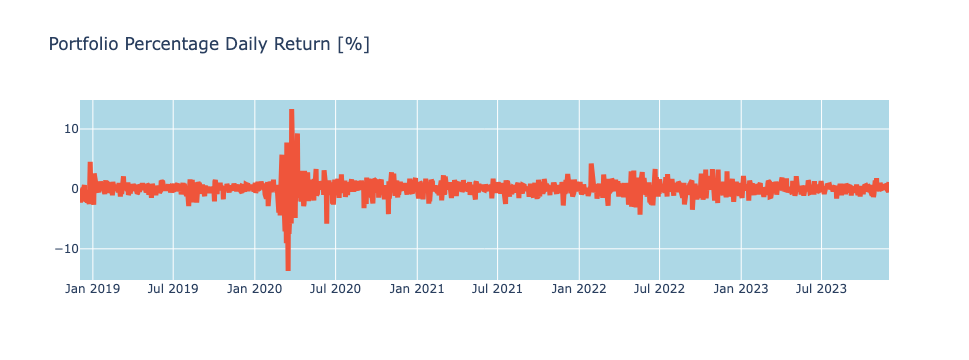

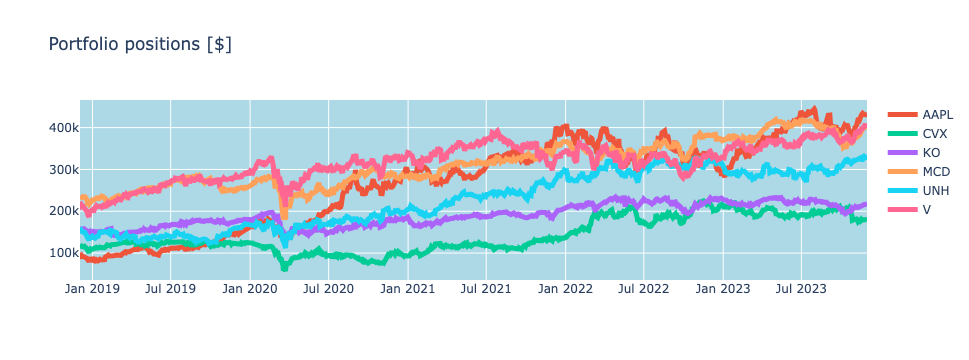

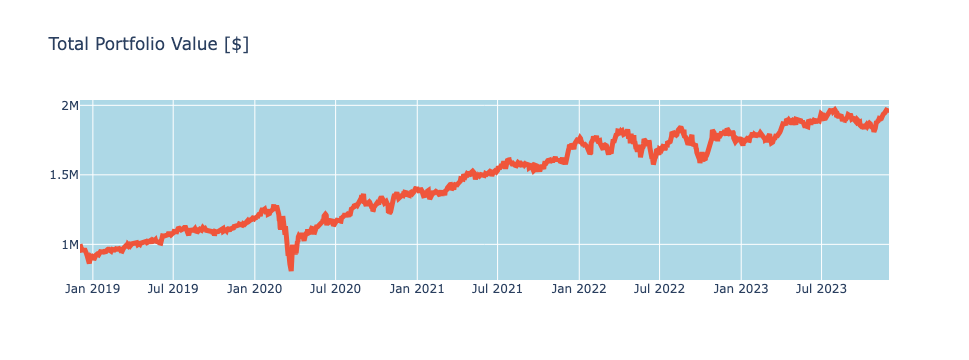

In [391]:
# Plot the portfolio percentage daily return
plot_stock_data(portfolio_df[['Date', 'Portfolio Daily Return [%]']], 'Portfolio Percentage Daily Return [%]')

# Plot each stock position in our portfolio over time
# This graph shows how our initial investment in each individual stock grows over time
plot_stock_data(portfolio_df.drop(['Portfolio Value [$]', 'Portfolio Daily Return [%]'], axis = 1), 'Portfolio positions [$]')

# Plot the total daily value of the portfolio (sum of all positions)
plot_stock_data(portfolio_df[['Date', 'Portfolio Value [$]']], 'Total Portfolio Value [$]')

In [393]:
# Define the simulation engine function 
# The function receives: 
    # (1) portfolio weights
    # (2) initial investment amount
# The function performs asset allocation and calculates portfolio statistical metrics including Sharpe ratio
# The function returns: 
    # (1) Expected portfolio return 
    # (2) Expected volatility 
    # (3) Sharpe ratio 
    # (4) Return on investment 
    # (5) Final portfolio value in dollars


def simulation_engine(weights, initial_investment):
    # Perform asset allocation using the random weights (sent as arguments to the function)
    portfolio_df = asset_allocation(close_price, weights, initial_investment)
  
    # Calculate the return on the investment 
    # Return on investment is calculated using the last final value of the portfolio compared to its initial value
    return_on_investment = ((portfolio_df['Portfolio Value [$]'][-1:] - 
                             portfolio_df['Portfolio Value [$]'][0])/ 
                             portfolio_df['Portfolio Value [$]'][0]) * 100
  
    # Daily change of every stock in the portfolio (Note that we dropped the date, portfolio daily worth and daily % returns) 
    portfolio_daily_return_df = portfolio_df.drop(columns = ['Date', 'Portfolio Value [$]', 'Portfolio Daily Return [%]'])
    portfolio_daily_return_df = portfolio_daily_return_df.pct_change(1) 
  
    # Portfolio Expected Return formula
    expected_portfolio_return = np.sum(weights * portfolio_daily_return_df.mean() ) * 252
  
    # Portfolio volatility (risk) formula
    # The risk of an asset is measured using the standard deviation which indicates the dispertion away from the mean
    # The risk of a portfolio is not a simple sum of the risks of the individual assets within the portfolio
    # Portfolio risk must consider correlations between assets within the portfolio which is indicated by the covariance 
    # The covariance determines the relationship between the movements of two random variables
    # When two stocks move together, they have a positive covariance when they move inversely, the have a negative covariance 

    covariance = portfolio_daily_return_df.cov() * 252 
    expected_volatility = np.sqrt(np.dot(weights.T, np.dot(covariance, weights)))

    # Check out the chart for the 10-years U.S. treasury at https://ycharts.com/indicators/10_year_treasury_rate
    rf = 0.03 # Try to set the risk free rate of return to 1% (assumption)

    # Calculate Sharpe ratio
    sharpe_ratio = (expected_portfolio_return - rf)/expected_volatility 
    return expected_portfolio_return, expected_volatility, sharpe_ratio, portfolio_df['Portfolio Value [$]'][-1:].values[0], return_on_investment.values[0]
  

In [395]:
# Test out the "simulation_engine" function and print out statistical metrics
# Define the initial investment amount
initial_investment = 1000000
portfolio_metrics = simulation_engine(weights, initial_investment)

In [397]:
print('Expected Portfolio Annual Return = {:.2f}%'.format(portfolio_metrics[0] * 100))
print('Portfolio Standard Deviation (Volatility) = {:.2f}%'.format(portfolio_metrics[1] * 100))
print('Sharpe Ratio = {:.2f}'.format(portfolio_metrics[2]))
print('Portfolio Final Value = ${:.2f}'.format(portfolio_metrics[3]))
print('Return on Investment = {:.2f}%'.format(portfolio_metrics[4]))

Expected Portfolio Annual Return = 16.43%
Portfolio Standard Deviation (Volatility) = 21.40%
Sharpe Ratio = 0.63
Portfolio Final Value = $1973544.54
Return on Investment = 97.35%


**h)  (5%) Simulate a sample of 20,000 different portfolio weights and plot their expected returns and volatility in a graph.**

In [318]:
# Set the number of simulation runs
sim_runs = 10000
initial_investment = 1000000

# Placeholder to store all weights
weights_runs = np.zeros((sim_runs, n))

# Placeholder to store all Sharpe ratios
sharpe_ratio_runs = np.zeros(sim_runs)

# Placeholder to store all expected returns
expected_portfolio_returns_runs = np.zeros(sim_runs)

# Placeholder to store all volatility values
volatility_runs = np.zeros(sim_runs)

# Placeholder to store all returns on investment
return_on_investment_runs = np.zeros(sim_runs)

# Placeholder to store all final portfolio values
final_value_runs = np.zeros(sim_runs)

for i in range(sim_runs):
    # Generate random weights 
    weights = generate_portfolio_weights(n)
    # Store the weights
    weights_runs[i,:] = weights
    
    # Call "simulation_engine" function and store Sharpe ratio, return and volatility
    # Note that asset allocation is performed using the "asset_allocation" function  
    expected_portfolio_returns_runs[i], volatility_runs[i], sharpe_ratio_runs[i], final_value_runs[i], return_on_investment_runs[i] = simulation_engine(weights, initial_investment)
    print("Simulation Run = {}".format(i))   
    print("Weights = {}, Final Value = ${:.2f}, Sharpe Ratio = {:.2f}".format(weights_runs[i].round(3), final_value_runs[i], sharpe_ratio_runs[i]))   
    print('\n')


Simulation Run = 0
Weights = [0.217 0.064 0.322 0.076 0.23  0.091], Final Value = $2240116.40, Sharpe Ratio = 0.71


Simulation Run = 1
Weights = [0.219 0.111 0.142 0.152 0.116 0.259], Final Value = $2274868.48, Sharpe Ratio = 0.71


Simulation Run = 2
Weights = [0.224 0.256 0.269 0.083 0.021 0.147], Final Value = $2162573.49, Sharpe Ratio = 0.65


Simulation Run = 3
Weights = [0.07  0.345 0.132 0.113 0.022 0.317], Final Value = $1814644.27, Sharpe Ratio = 0.52


Simulation Run = 4
Weights = [0.047 0.267 0.024 0.145 0.266 0.251], Final Value = $1889121.43, Sharpe Ratio = 0.58


Simulation Run = 5
Weights = [0.264 0.145 0.014 0.146 0.238 0.193], Final Value = $2461348.10, Sharpe Ratio = 0.77


Simulation Run = 6
Weights = [0.3   0.123 0.199 0.205 0.009 0.165], Final Value = $2409737.33, Sharpe Ratio = 0.74


Simulation Run = 7
Weights = [0.208 0.153 0.21  0.104 0.282 0.044], Final Value = $2246857.25, Sharpe Ratio = 0.71


Simulation Run = 8
Weights = [0.271 0.014 0.328 0.13  0.036 0.22

In [320]:
# List all Sharpe ratios generated from the simulation
sharpe_ratio_runs

array([0.71264052, 0.71267857, 0.65351858, ..., 0.51488372, 0.55308256,
       0.74090037])

In [322]:
# Return the index of the maximum Sharpe ratio (Best simulation run) 
sharpe_ratio_runs.argmax()

6211

In [324]:
# Return the maximum Sharpe ratio value
sharpe_ratio_runs.max()

0.9123116767280762

In [326]:
weights_runs

array([[0.21689634, 0.06399614, 0.32197609, 0.07625516, 0.22978333,
        0.09109293],
       [0.21941352, 0.11097057, 0.142387  , 0.15215912, 0.11589249,
        0.25917731],
       [0.22368412, 0.25588479, 0.26917179, 0.08328231, 0.02145854,
        0.14651844],
       ...,
       [0.03275361, 0.29697603, 0.2002863 , 0.22752158, 0.11498855,
        0.12747393],
       [0.04335839, 0.13424777, 0.28535797, 0.23422755, 0.15907721,
        0.14373111],
       [0.26671228, 0.11639326, 0.16904324, 0.1347653 , 0.09703141,
        0.21605452]])

In [328]:
# Obtain the portfolio weights that correspond to the maximum Sharpe ratio (Golden set of weights!)
weights_runs[sharpe_ratio_runs.argmax(), :]

array([0.57229026, 0.04929757, 0.09219233, 0.0356675 , 0.16811808,
       0.08243425])

In [332]:
# Return Sharpe ratio, volatility corresponding to the best weights allocation (maximum Sharpe ratio)
optimal_portfolio_return, optimal_volatility, optimal_sharpe_ratio, highest_final_value, optimal_return_on_investment = simulation_engine(weights_runs[sharpe_ratio_runs.argmax(), :], initial_investment)

In [334]:
print('Best Portfolio Metrics Based on {} Monte Carlo Simulation Runs:'.format(sim_runs))
print('  - Portfolio Expected Annual Return = {:.02f}%'.format(optimal_portfolio_return * 100))
print('  - Portfolio Standard Deviation (Volatility) = {:.02f}%'.format(optimal_volatility * 100))
print('  - Sharpe Ratio = {:.02f}'.format(optimal_sharpe_ratio))
print('  - Final Value = ${:.02f}'.format(highest_final_value))
print('  - Return on Investment = {:.02f}%'.format(optimal_return_on_investment))

Best Portfolio Metrics Based on 10000 Monte Carlo Simulation Runs:
  - Portfolio Expected Annual Return = 26.29%
  - Portfolio Standard Deviation (Volatility) = 25.53%
  - Sharpe Ratio = 0.91
  - Final Value = $3211598.21
  - Return on Investment = 221.16%


**i)	(6%) Construct the minimum-variance portfolio and report the weight of each asset in it. Report the expected return, volatility (standard deviation), and the Sharpe ratio of the portfolio. Indicate the portfolio on the graph of (h).**

In [336]:
# Create a DataFrame that contains volatility, return, and Sharpe ratio for all simualation runs
sim_out_df = pd.DataFrame({'Volatility': volatility_runs.tolist(), 'Portfolio_Return': expected_portfolio_returns_runs.tolist(), 'Sharpe_Ratio': sharpe_ratio_runs.tolist() })
sim_out_df

,Volatility,Portfolio_Return,Sharpe_Ratio
0,0.211714,0.180876,0.712641
1,0.222361,0.188472,0.712679
2,0.223822,0.176272,0.653519
3,0.240367,0.155921,0.523869
4,0.237212,0.167333,0.578944
...,...,...,...
9995,0.227968,0.182783,0.670194
9996,0.210534,0.151580,0.577481
9997,0.222027,0.144318,0.514884
9998,0.206160,0.144024,0.553083


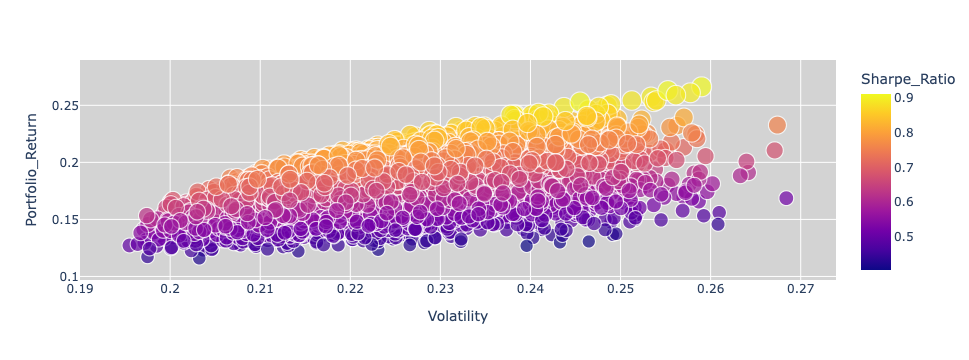

In [346]:
# Plot volatility vs. return for all simulation runs
# Highlight the volatility and return that corresponds to the highest Sharpe ratio
import plotly.graph_objects as go
fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_Ratio', size = 'Sharpe_Ratio', hover_data = ['Sharpe_Ratio'] )
fig.update_layout({'plot_bgcolor': "lightgray"})
fig.show()


# Use this code if Sharpe ratio is negative
# fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_Ratio', hover_data = ['Sharpe_Ratio'] )


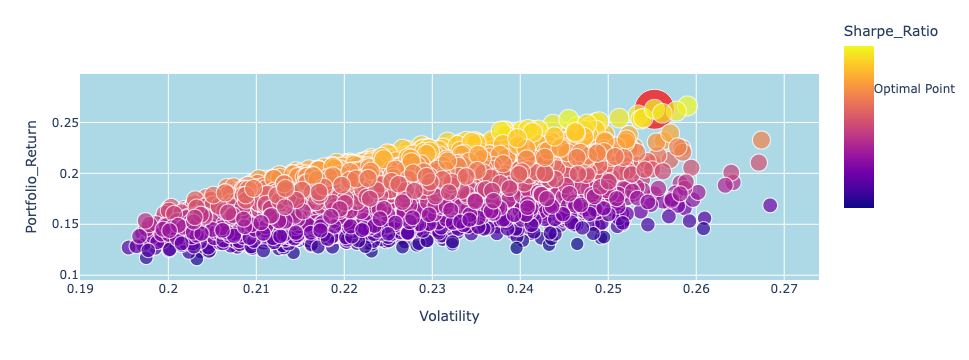

In [350]:
# Let's highlight the point with the highest Sharpe ratio
fig = px.scatter(sim_out_df, x = 'Volatility', y = 'Portfolio_Return', color = 'Sharpe_Ratio', size = 'Sharpe_Ratio', hover_data = ['Sharpe_Ratio'] )
fig.add_trace(go.Scatter(x = [optimal_volatility], y = [optimal_portfolio_return], mode = 'markers', name = 'Optimal Point', marker = dict(size=[40], color = 'red')))
fig.update_layout(coloraxis_colorbar = dict(y = 0.8, dtick = 5))
fig.update_layout({'plot_bgcolor': "lightblue"})
fig.show()

**j)   (5%) After you have figured out the tangency portfolio, you plan to invest the $100M into this portfolio based on the adjusted closing prices on Jan. 2, 2024. What is the specific dollar amount of your investment for each stock? Note: your Python code should be able to generate the values in USD dollars**

**k)  (4%) Find adjusted closing price data for the S&P 500 stock index (your market proxy, ticker = ^GSPC) for the same time period you used for all 6 stocks. Calculate and report the mean rate of return and volatility (standard deviation) for this index.**

In [366]:
ticker_symbol_spy = ['^GSPC']   # Example: SPY.

# Download data
stock_price = yf.download(ticker_symbol_spy, start='2018-12-01', end='2023-12-01')

# Get the adjusted close prices
adj_close_prices = stock_price['Adj Close']

# Display the adjusted close prices
print(adj_close_prices.head())

[*********************100%***********************]  1 of 1 completed

Date
2018-12-03    2790.370117
2018-12-04    2700.060059
2018-12-06    2695.949951
2018-12-07    2633.080078
2018-12-10    2637.719971
Name: Adj Close, dtype: float64


In [372]:
# The objective of this code cell is to calculate the percentage daily return
# We will perform this calculation on all stocks except for the first column which is "Date"
daily_returns_spy = stock_price.iloc[:,1:].pct_change() * 100
daily_returns_spy.replace(np.nan, 0, inplace = True)
daily_returns_spy

,High,Low,Close,Adj Close,Volume
Date,,,,,
2018-12-03,0.000000,0.000000,0.000000,0.000000,0.000000
2018-12-04,-0.508896,-2.747548,-3.236490,-3.236490,6.967297
2018-12-06,-3.222623,-2.804778,-0.152223,-0.152223,14.720166
2018-12-07,0.459549,0.061409,-2.332012,-2.332012,-18.110273
2018-12-10,-2.253244,-1.521456,0.176215,0.176215,-1.870710
...,...,...,...,...,...
2023-11-24,-0.177744,0.170515,0.059687,0.059687,-46.118884
2023-11-27,0.004604,-0.142330,-0.195416,-0.195416,107.623666
2023-11-28,0.167089,-0.127797,0.098012,0.098012,5.354011


In [419]:
historical_volatility_spy = daily_returns_spy['Adj Close'].std()* (252**0.5)  # Annualize the volatility  
# Display the results
print("Historical Volatility (Annualized):")
print(historical_volatility_spy)

Historical Volatility (Annualized):
21.60551998543513


**l)	(5%) Calculate and report the correlation coefficients between each stock and the S&P 500 stock index and for each possible pairing of individual stocks (in other words, construct the correlation matrix of all 7 returns: 6 stocks + index, i.e., 7 x 7 correlation matrix). Remember to make it a symmetric matrix. Explain the differences among the correlation coefficients.**

In [426]:
ticker_symbol_spy = ['AAPL','UNH', 'V', 'KO', 'CVX', 'MCD','^GSPC']   # Example: Apple Inc.

# Download data
stock_price_spy = yf.download(ticker_symbol_spy, start='2018-12-01', end='2023-12-01')

# Get the adjusted close prices
adj_close_prices_spy = stock_price_spy['Adj Close']

# Display the adjusted close prices
print(adj_close_prices_spy.head())

[*********************100%***********************]  7 of 7 completed

Ticker                          AAPL        CVX         KO         MCD  \
Date                                                                     
2018-12-03 00:00:00+00:00  44.131866  93.791641  41.561531  162.185715   
2018-12-04 00:00:00+00:00  42.190559  91.125656  41.469524  161.896957   
2018-12-06 00:00:00+00:00  41.720154  90.091904  41.302242  162.255676   
2018-12-07 00:00:00+00:00  40.232544  89.765472  41.059689  160.077118   
2018-12-10 00:00:00+00:00  40.497585  89.337975  41.185150  161.555756   

Ticker                            UNH           V        ^GSPC  
Date                                                            
2018-12-03 00:00:00+00:00  262.621338  139.075455  2790.370117  
2018-12-04 00:00:00+00:00  255.485596  132.975357  2700.060059  
2018-12-06 00:00:00+00:00  253.926300  135.286865  2695.949951  
2018-12-07 00:00:00+00:00  246.891403  131.507874  2633.080078  
2018-12-10 00:00:00+00:00  244.460861  132.246414  2637.719971  


[*********************100%***********************]  7 of 7 completed


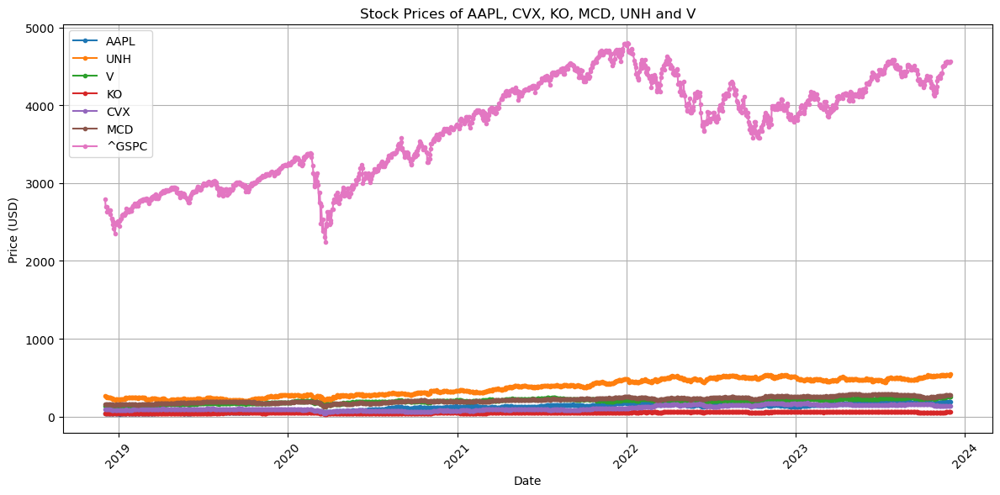

In [434]:

# Specify the starting and ending dates
startDate = dt.datetime(2018, 12, 1)
endDate = dt.datetime(2023, 12, 1)

# Create an empty DataFrame to hold the price data
stock_price_spy = yf.download(ticker_symbol_spy, start=startDate, end=endDate)['Adj Close']

# Plot the stock prices
plt.figure(figsize=(12, 6))
for ticker in ticker_symbol_spy:
    plt.plot(stock_price_spy.index, stock_price_spy[ticker], marker='.', label=ticker)

plt.title('Stock Prices of AAPL, CVX, KO, MCD, UNH and V')
plt.xlabel('Date')
plt.ylabel('Price (USD)')
plt.legend()
plt.grid()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [454]:
# The objective of this code cell is to calculate the percentage daily return
# We will perform this calculation on all stocks except for the first column which is "Date"
daily_returns_df_1 = stock_price_spy.iloc[:,:].pct_change() * 100
daily_returns_df_1.replace(np.nan, 0, inplace = True)
daily_returns_df_1

Ticker,AAPL,CVX,KO,MCD,UNH,V,^GSPC
Date,,,,,,,
2018-12-03 00:00:00+00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2018-12-04 00:00:00+00:00,-4.398878,-2.842455,-0.221375,-0.178041,-2.717122,-4.386178,-3.236490
2018-12-06 00:00:00+00:00,-1.114955,-1.134425,-0.403386,0.221572,-0.610326,1.738298,-0.152223
2018-12-07 00:00:00+00:00,-3.565686,-0.362331,-0.587265,-1.342670,-2.770448,-2.793318,-2.332012
2018-12-10 00:00:00+00:00,0.658774,-0.476239,0.305559,0.923703,-0.984458,0.561594,0.176215
...,...,...,...,...,...,...,...
2023-11-24 00:00:00+00:00,-0.700433,0.394917,0.256762,0.216355,0.614233,0.228613,0.059687
2023-11-27 00:00:00+00:00,-0.094760,-0.372661,-0.187811,-0.247748,-0.641562,-0.062935,-0.195416
2023-11-28 00:00:00+00:00,0.321415,0.796623,0.205285,0.088699,-0.562912,-0.472177,0.098012


In [456]:
# Insert the date column at the start of the Pandas DataFrame (@ index = 0)



In [296]:
# Define a function that performs interactive data visualization using Plotly Express
def plot_stock_data(dt, title):
    
    fig = px.line(title = title)
    
    # For loop that plots all stock prices in the pandas dataframe df
    # Note that index starts with 1 because we want to skip the date column
    
    for i in dt.columns[1:]:
        fig.add_scatter(x = dt['Date'], y = dt[i], name = i)
        fig.update_traces(line_width = 5)
        fig.update_layout({'plot_bgcolor': "white"})

    fig.show()

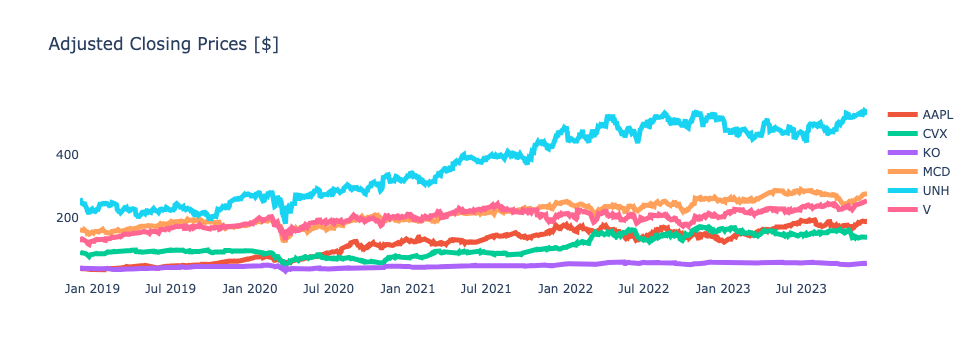

In [300]:
# Plot closing prices using plotly Express. Note that we used the same pre-defined function "plot_financial_data"
plot_stock_data(close_price, 'Adjusted Closing Prices [$]')

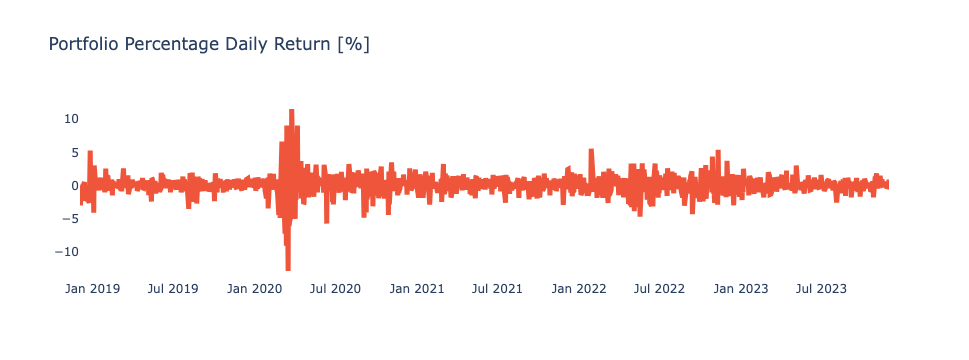

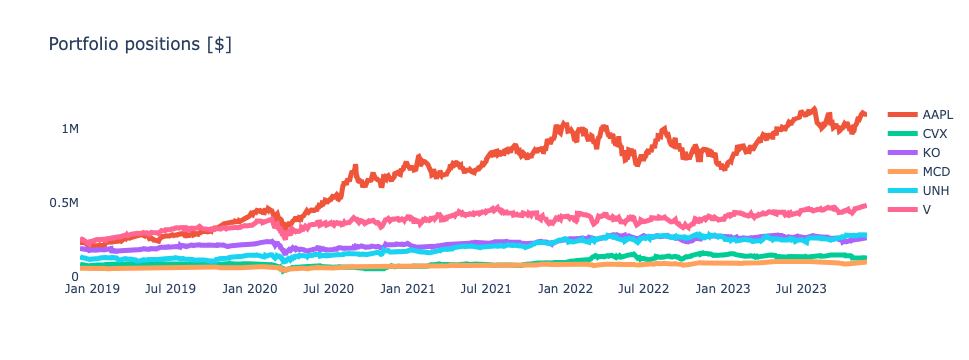

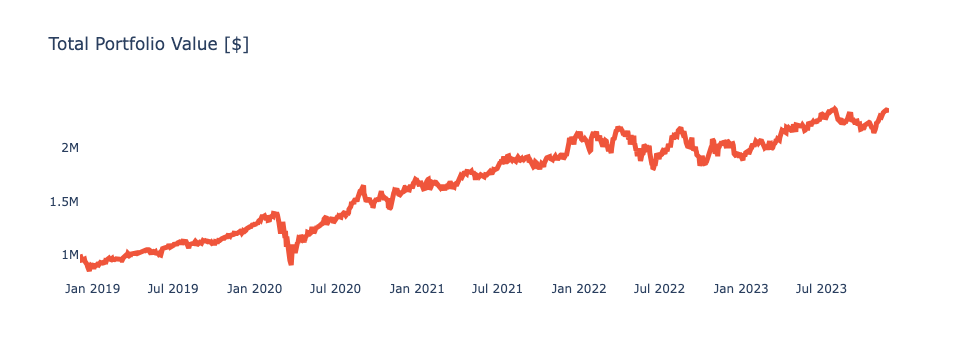

In [306]:
# Plot the portfolio percentage daily return
plot_stock_data(portfolio_df[['Date', 'Portfolio Daily Return [%]']], 'Portfolio Percentage Daily Return [%]')

# Plot each stock position in our portfolio over time
# This graph shows how our initial investment in each individual stock grows over time
plot_stock_data(portfolio_df.drop(['Portfolio Value [$]', 'Portfolio Daily Return [%]'], axis = 1), 'Portfolio positions [$]')

# Plot the total daily value of the portfolio (sum of all positions)
plot_stock_data(portfolio_df[['Date', 'Portfolio Value [$]']], 'Total Portfolio Value [$]')